In [1]:
!pip install opencv-python pixellib

In [2]:
import cv2
import numpy as np
import torch
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet101
import matplotlib.pyplot as plt

print(cv2.__version__)

4.11.0


원본 고양이 이미지 크기: (340, 340, 3)
배경(사막) 이미지 크기: (165, 340, 3)


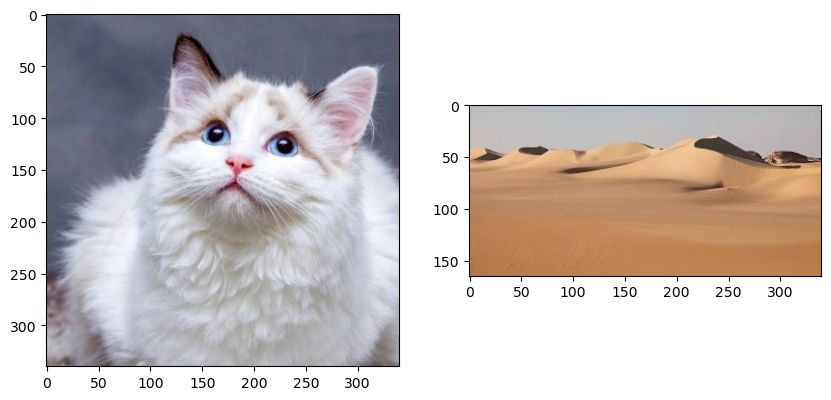

In [3]:
cat_img_path = "cat.jpg"  # 고양이 이미지를 준비해주세요
sand_img_path = "sand.jpg"  # 사막 배경 이미지를 준비해주세요

cat_img = cv2.imread(cat_img_path)
sand_img = cv2.imread(sand_img_path)

cat_img = cv2.cvtColor(cat_img, cv2.COLOR_BGR2RGB)
sand_img = cv2.cvtColor(sand_img, cv2.COLOR_BGR2RGB)

print(f"원본 고양이 이미지 크기: {cat_img.shape}")
print(f"배경(사막) 이미지 크기: {sand_img.shape}")

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cat_img)

plt.subplot(1, 2, 2)
plt.imshow(sand_img)

plt.show()

In [4]:
model = deeplabv3_resnet101(pretrained=True).eval()

transform = T.Compose([
    T.ToPILImage(),
    T.Resize((520, 520)),  # 모델 입력 크기
    T.ToTensor(),
])

input_tensor = transform(cat_img).unsqueeze(0)

with torch.no_grad():
    output = model(input_tensor)["out"][0]
    output_predictions = output.argmax(0).byte().cpu().numpy()

print(f"추론 마스크 크기 (Before Resize): {output_predictions.shape}")

/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /home/jovyan/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth


100%|██████████| 233M/233M [00:02<00:00, 93.9MB/s] 


추론 마스크 크기 (Before Resize): (520, 520)


In [5]:
# 마스크를 원본 크기로 Resize
output_predictions_resized = cv2.resize(output_predictions, (cat_img.shape[1], cat_img.shape[0]), interpolation=cv2.INTER_NEAREST)

print(f"추론 마스크 크기 (After Resize): {output_predictions_resized.shape}")

추론 마스크 크기 (After Resize): (340, 340)


In [6]:
unique_classes = np.unique(output_predictions_resized)
print(f"예측된 클래스 ID: {unique_classes}")

예측된 클래스 ID: [0 8]


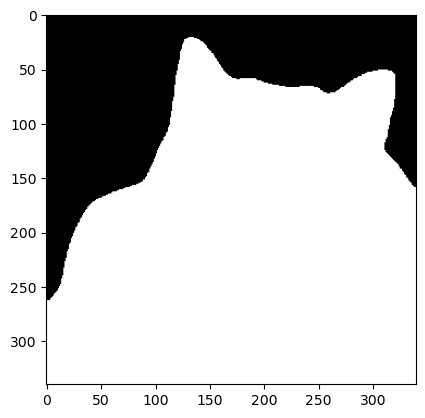

In [7]:
target_class_id = unique_classes[-1]

seg_map = (output_predictions_resized == target_class_id)
img_mask = seg_map.astype(np.uint8) * 255

plt.imshow(img_mask, cmap='gray')
plt.show()

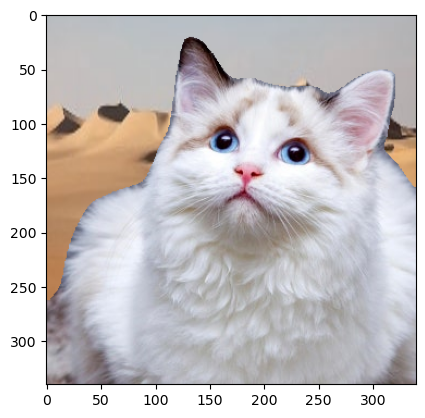

In [8]:
# 배경을 고양이 이미지 크기에 맞춤
sand_img_resized = cv2.resize(sand_img, (cat_img.shape[1], cat_img.shape[0]))

# 고양이 부분만 남기고 배경 적용
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)  # 3채널 변환
result_img = np.where(img_mask_color == 255, cat_img, sand_img_resized)  # 마스크 기반 합성

plt.imshow(result_img)
plt.show()

생각보다 잘된것 같다.. 다만 고양이 크기랑 사막사진이랑 비율이 비슷하게 설정되서 고양이가 과도하게 큰것 말고는..\
다른것도 시도해보자.

In [18]:
import cv2
import os
import numpy as np
import torch
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet101
import matplotlib.pyplot as plt

print('슝=3')

슝=3


In [22]:
model = deeplabv3_resnet101(weights='DeepLabV3_ResNet101_Weights.DEFAULT').eval()

In [23]:
img_path = '다운로드 (4).jpg'
img_orig = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
img_orig_blur = cv2.GaussianBlur(img_orig, (21, 21), 0)

In [24]:
trf = T.Compose([
    T.ToPILImage(),
    T.Resize(640),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
input_img = trf(img_rgb).unsqueeze(0)

In [25]:
# 모델 예측 (인물 영역 추출)
with torch.no_grad():
    out = model(input_img)['out']
om = torch.argmax(out.squeeze(), dim=0).detach().cpu().numpy()

In [26]:
# PASCAL VOC 데이터셋에서 인물(person)은 15번 클래스입니다.
# 원본 이미지 크기에 맞게 마스크를 복원합니다.
mask = (om == 15).astype(np.uint8) * 255
mask_resized = cv2.resize(mask, (img_orig.shape[1], img_orig.shape[0]), interpolation=cv2.INTER_NEAREST)
img_mask_color = cv2.cvtColor(mask_resized, cv2.COLOR_GRAY2BGR)

In [27]:
# Untitled (1) 파일의 핵심 로직: np.where 합성
# 마스크가 255(인물)인 곳은 원본, 아니면 블러 이미지를 가져옵니다.
img_concat = np.where(img_mask_color == 255, img_orig, img_orig_blur)

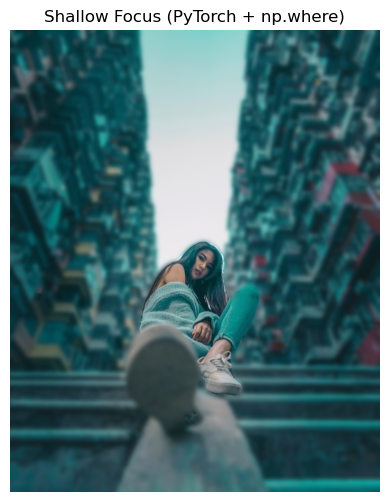

In [28]:
# 결과 출력
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.title("Shallow Focus (PyTorch + np.where)")
plt.axis('off')
plt.show()

(np.float64(-0.5), np.float64(619.5), np.float64(774.5), np.float64(-0.5))

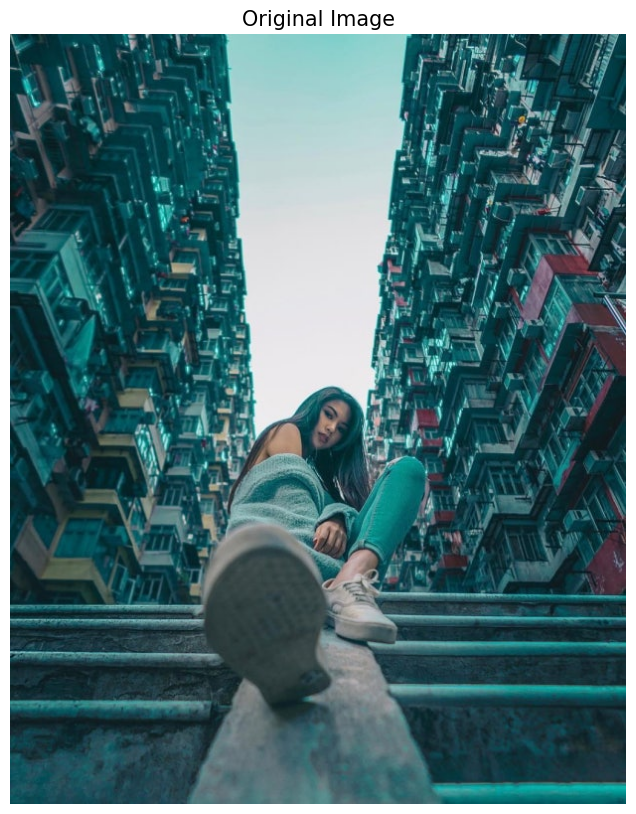

In [30]:
plt.figure(figsize=(20, 10))

# 왼쪽: 원본 사진
plt.subplot(1, 2, 1)
plt.title("Original Image", fontsize=15)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.axis('off')

원본 사진과 비교시 아주 잘 뽑혔다.. v3 모델이 훌륭한것 같다.. 문제점이 딱히 보이지는 않는다 아직까지는...

아까 퍼실님이 잠깐보여주신 앱까지는 못만들어도 def 함수를 이용해서 사진만 넣으면 알아서 아웃 포커싱 할수있게\
함수를 만들어보자

In [31]:
import cv2
import os
import numpy as np
import torch
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet101
import matplotlib.pyplot as plt

In [32]:
#  모델 준비 (처음 한 번만 실행됨)
print("모델을 로딩 중입니다... 잠시만 기다려주세요.")
model = deeplabv3_resnet101(weights='DeepLabV3_ResNet101_Weights.DEFAULT').eval()

모델을 로딩 중입니다... 잠시만 기다려주세요.


In [35]:
# 아웃포커싱 함수 정의
def process_outfocusing(image_name):
    # 이미지 읽기
    img_orig = cv2.imread(image_name)
    img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
    
    # 배경 블러 처리 (Untitled (1) 로직)
    img_orig_blur = cv2.GaussianBlur(img_orig, (21, 21), 0)

    # 파이토치 마스크 생성
    trf = T.Compose([
        T.ToPILImage(),
        T.Resize(640),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_img = trf(img_rgb).unsqueeze(0)

    with torch.no_grad():
        out = model(input_img)['out']
    om = torch.argmax(out.squeeze(), dim=0).detach().cpu().numpy()

    # 인물 마스크 복원 (15번: Person)
    mask = (om == 15).astype(np.uint8) * 255
    mask_resized = cv2.resize(mask, (img_orig.shape[1], img_orig.shape[0]), interpolation=cv2.INTER_NEAREST)
    img_mask_color = cv2.cvtColor(mask_resized, cv2.COLOR_GRAY2BGR)

    # np.where 합성 (Untitled (1) 로직)
    final_result = np.where(img_mask_color == 255, img_orig, img_orig_blur)

    # 결과 출력
    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.title(f"Original: {image_name}")
    plt.imshow(img_rgb)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Outfocusing Result")
    plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

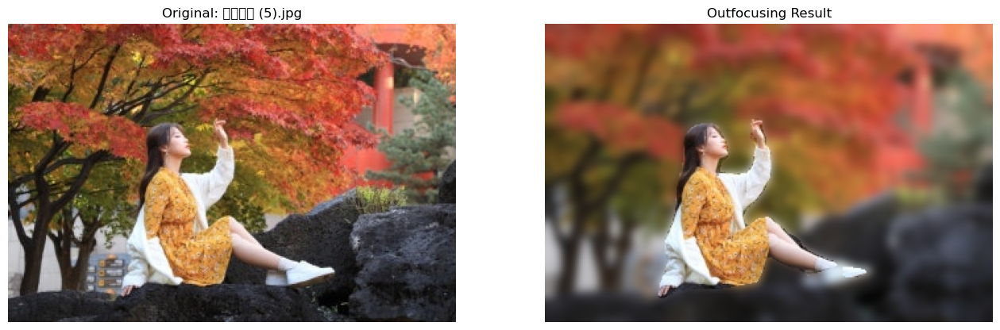

In [37]:
process_outfocusing('다운로드 (5).jpg')
plt.show()

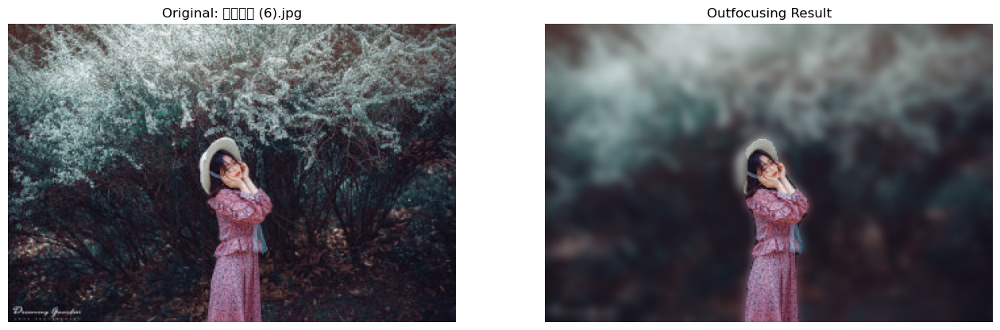

In [38]:
process_outfocusing('다운로드 (6).jpg')
plt.show()

## 형편없는 누끼
위 두사진은 인물과 배경의 구분이 뚜렷하지않아 인물의 옷부분이 짤리는 현상과 배경의 흐릿함이 번지는 보기좋지 않은\
결과물이 나오고 말았다. 인물이 작아서 그런것도 있고, 크로마키 만큼은 아니지만 배경과의 뚜렷한 명암대비가 적어서 그런것\
같기도 하다.

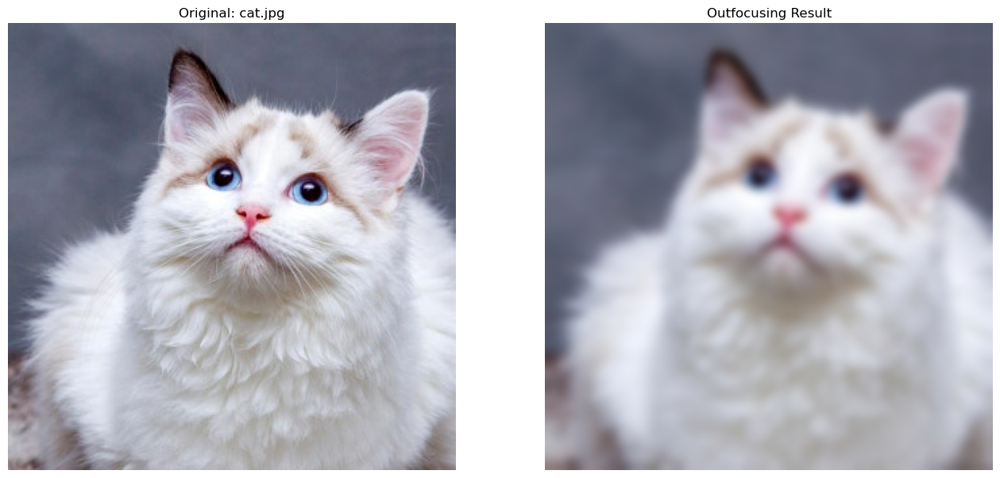

In [39]:
process_outfocusing('cat.jpg')
plt.show()

오 인물 마스크 설정할때 15번<<퍼슨으로 설정해두니 사람이없어져서 고양이를 블러처리해버렸다..

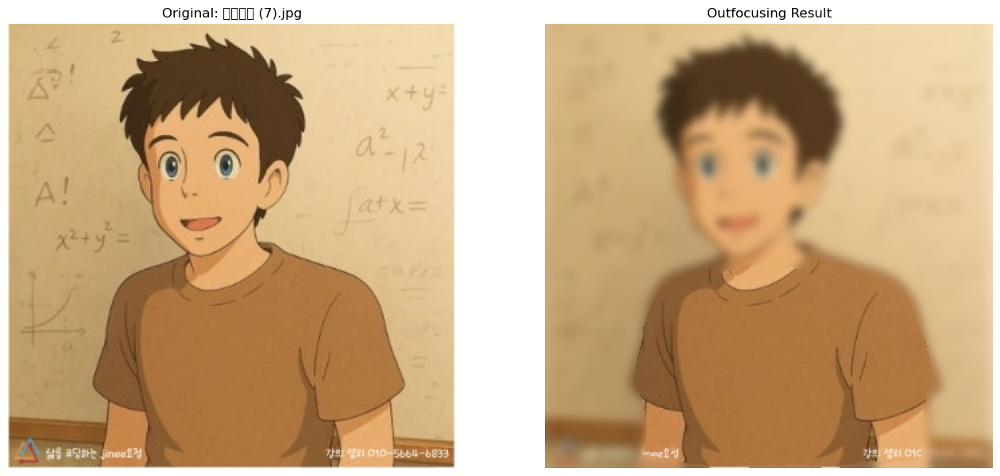

In [40]:
process_outfocusing('다운로드 (7).jpg')
plt.show()

와... ai사진이여서 사람이 아니라고 판단해서 블러처리 한걸까.. 아니면 단순히 그림사람이여서 블러 처리를 한걸까..\
아니면 ai는 사람이 아니니까 블러처리한걸까... 인물 그림사진을 넣어서 어디까지 사람이 아니라고 판단하는지 알아보자

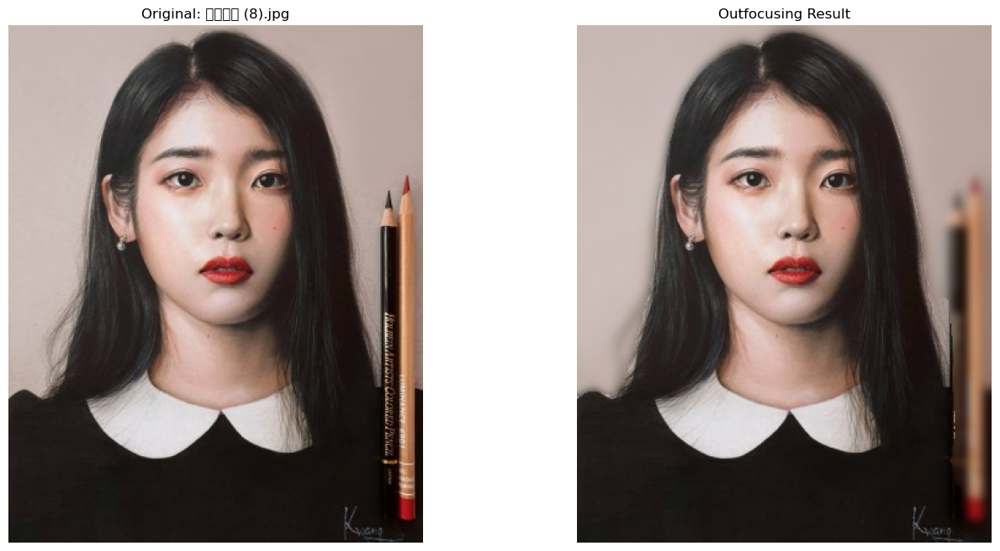

In [41]:
process_outfocusing('다운로드 (8).jpg')
plt.show()

사람도 살짝 속을수있는 사진같은 그림을 준비했는데 ai도 사람이라 판별해버리는 작가의 클라스를 칭찬해야될지\
아니면 속아버린 ai가 바보라고 해야될지 아직은 잘모르겠다.

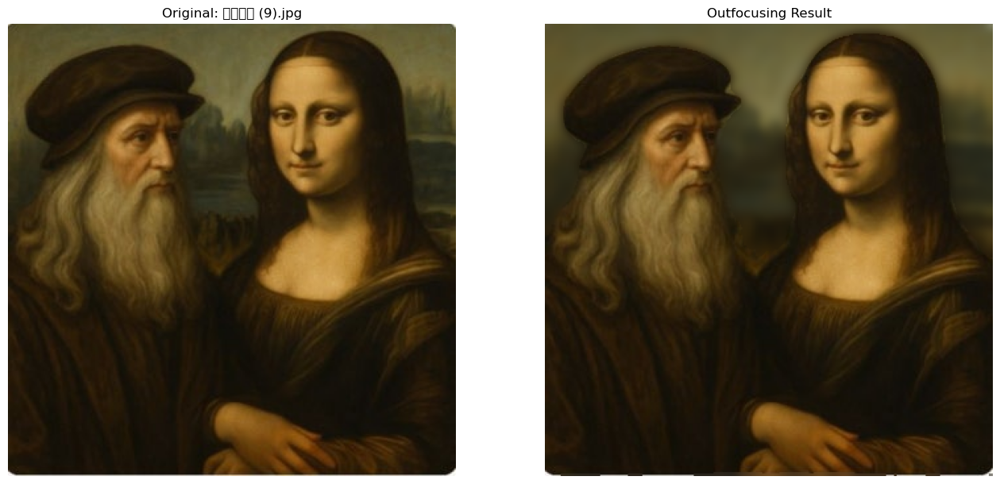

In [42]:
process_outfocusing('다운로드 (9).jpg')
plt.show()

아니 ai 남자사진은 그렇다고 치고 이건왜.. 둘다 사람으로 인식하는거지.. ai는 ai를 알아본다는건가..\
자신의 gpt 지브리화풍은 사람이 아니라 판단하고 다빈치형님의 그림은 사람이라 판단하는 ai의 판단력은 뭔지 궁금하다..

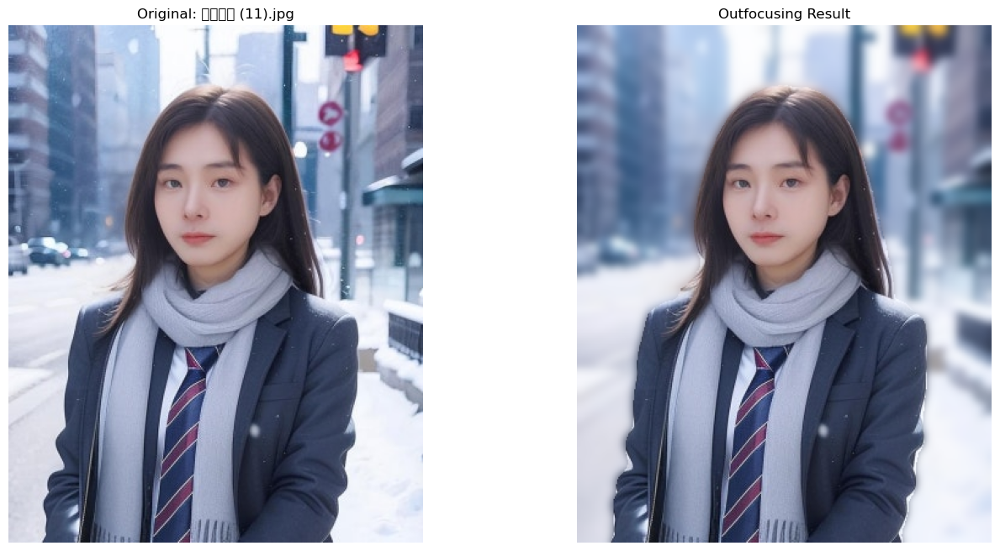

In [43]:
process_outfocusing('다운로드 (11).jpg')
plt.show()

인터넷에 떠도는 ai 실사위주의 ai 사진은 또 사람이라 판단했다. 자체적으로 ai판독기가 있는것 이라 기대는 하지않았지만\
살짝 아쉽다..\
-정리
*15번 인물 판독기는 실사화되면 대부분 사람으로 인식한다, 그림또한 실물과 유사하면 사람으로 인식해 나머지부분을 블로처리한다.\
*그리고 인물과 배경의 명암차이가 극명하지않으면 가장자리 부분은 배경과 겹쳐보이며 제대로 구분되지 않는걸 파악할수있었다.

 ## 문제점 보완하기
세그멘테이션 모델(DeepLabV3)이 만든 마스크는 기본적으로 '사람이다(255)'와 '아니다(0)'로 딱딱하게 나누어진다 \
이 때문에 머리카락처럼 얇은 부분이나 복잡한 경계선이 칼로 자른 듯 어색하게 보여지고 있다\
제미나이의 도움으로 이같은 문제점을 **소프트 마스킹** 으로 해결할수있다고 한다. 한번 적용해보자

In [57]:
# 기존 코드를 복사해왔다.
model = deeplabv3_resnet101(weights='DeepLabV3_ResNet101_Weights.DEFAULT').eval()

def process_outfocusing_soft(image_name):
    # 이미지 읽기
    img_orig = cv2.imread(image_name)
    img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
    
    # 배경 블러 처리 (미리 준비)
    img_orig_blur = cv2.GaussianBlur(img_orig, (21, 21), 0)

    # 2. 마스크 생성 (기존 PyTorch 로직)
    trf = T.Compose([
        T.ToPILImage(),
        T.Resize(640),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_img = trf(img_rgb).unsqueeze(0)

    with torch.no_grad():
        out = model(input_img)['out']
    om = torch.argmax(out.squeeze(), dim=0).detach().cpu().numpy()

    # 원본 크기에 맞춘 마스크 생성 (15: Person 클래스)
    mask = (om == 15).astype(np.uint8) * 255
    mask_resized = cv2.resize(mask, (img_orig.shape[1], img_orig.shape[0]), interpolation=cv2.INTER_NEAREST)

    # ---------------------------------------------------------
    # [핵심 추가] 소프트 마스킹 적용 단계
    # ---------------------------------------------------------
    # 1) 마스크 경계선을 부드럽게 가공 (숫자를 키울수록 더 부드러워짐)
    kernel = np.ones((3,3), np.uint8)
    mask_dilated = cv2.dilate(mask_resized, kernel, iterations=1)
    
    # 2) 마스크를 0~1 사이의 가중치(알파)로 변환 (3채널 BGR 확장)
    mask_soft = cv2.GaussianBlur(mask_dilated, (25,25), 0) # 블러 반경 확대
    alpha = cv2.cvtColor(mask_soft, cv2.COLOR_GRAY2BGR).astype(float) / 255.0
    
    # 3) 알파 블렌딩 공식으로 합성
    # (원본 * 인물비율) + (블러배경 * 배경비율)
    img_orig_float = img_orig.astype(float)
    img_blur_float = img_orig_blur.astype(float)
    
    final_result = (img_orig_float * alpha) + (img_blur_float * (1.0 - alpha))
    final_result = final_result.astype(np.uint8)
    # ---------------------------------------------------------

    # 3. 결과 출력
    plt.figure(figsize=(20, 10))
    
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(img_rgb)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Soft Masking Result")
    plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    plt.show()

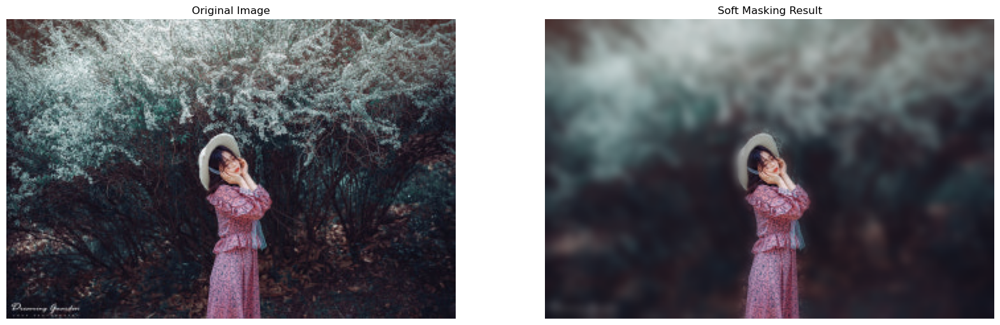

In [58]:
process_outfocusing_soft('다운로드 (6).jpg')

↑수정파일 ↓기존파일

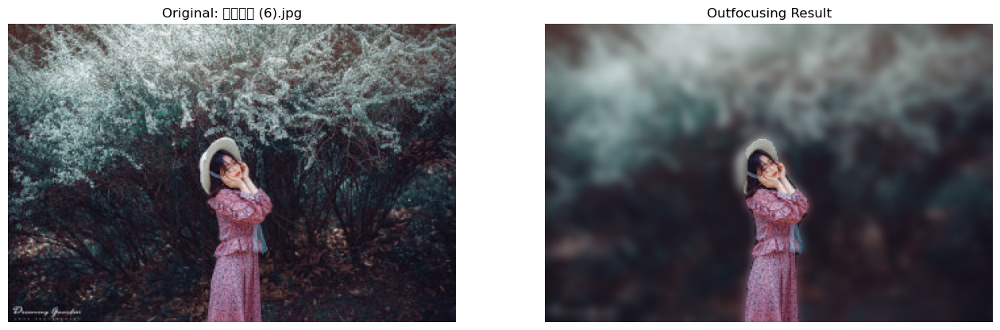

In [38]:
process_outfocusing('다운로드 (6).jpg')
plt.show()

모자부분을 제외하고는 드라마틱한 차이가없는것 같다..

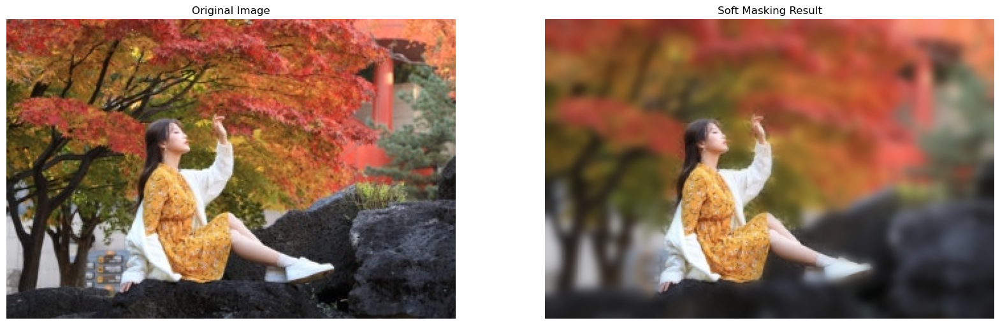

In [59]:
process_outfocusing_soft('다운로드 (5).jpg')

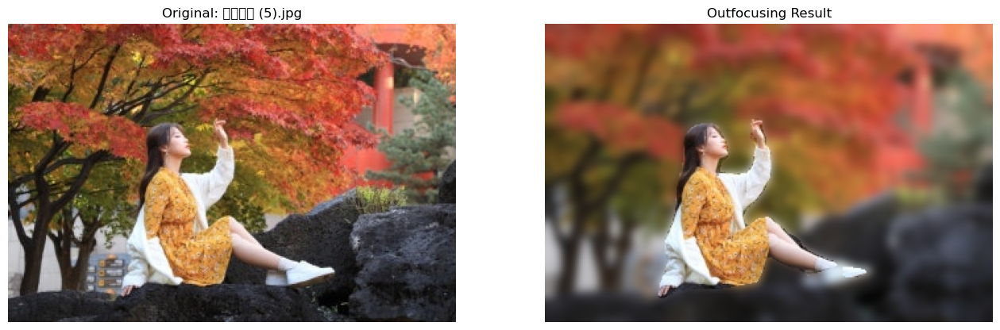

In [37]:
process_outfocusing('다운로드 (5).jpg')
plt.show()

이번사진은 애초에 V3가 인물을 인식할때부터 신발과 양말부분에서 사람의 경계선을 제대로 인식하지 못한 문제인것 같다.\
그래도 *소프트마스킹* 효과로 경계선부분의 모호한부분을 어느정도 보완할수있는 한가지 방법을 알아보았다.

 #### 프로젝트 회고 : 인물사진을 만들어보자!
 1. 목적
    * DeepLabV3+ 모델을 사용하여 사진속 인물의 영역을 분리한다
    * 분리된 배경에 블러 를 적용하여 아웃포커싱 효과를 표현해보았다
    * 단순한 합성이 아닌 경계선 처리를 부드럽게 하는 **소프트마스킹** 기술을 학습했다. 
      
 2. 진행중 주요 학습 내용 정리
    * 지난 학습에서 배운 OpenCV를 다시한번 사용 연산으로 활용해보았다
    * 이용방법 : 인물 마스크와 배경 마스크를 반전하여 각각 만든뒤 원본과 블러 이미지에서 필요한부분을 뽑아내 cv2로 합침
      \
      
      
 3. 문제점 및 해결
    * 라이브러리 충돌 mediapipe가 자꾸 에러가 났다.. *from matplotlib import pyplot as plt* << 이부분인데\
    * *import matplotlib.pyplot as plt* <<이렇게 바꾸니 해결되었다.
    * 어색한 경계선.. 인물과 배경이 칼처럼 잘려있어 합성이 부자연스러웠다.
    * *소프트 마스킹* 도입 하여 마스크 자체에 가우시안 블러를 적용하여 조금더 나은 결과물을 출력할수있었다.
    * 인물화 사람인식 실패... 하지만 실사화의 가까울수록 사람으로 인식하여 배경을 블러처리 하였다.
      \
      
 
 4. 최종 마무리 
    * 인물의 머리카락이나 어깨선이 배경과 자연스럽게 어우러지는 인물사진을 구현해보았다.
    * 현재는 사람만 인식하게 함수를 만들었지만 후에 강아지나 사물등 mscoco 처럼 클래스로 확장을 시도해볼수도 있을것같다.
    * 여담이지만 인물화 그림 블러처리하는것 보고 아직은 인간시대의 끝이 도래하기에는 조금 더 시간이 걸릴것 같다.